# Installation et mise en place de l'environnement


In [106]:
!pip install imgaug


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [107]:
!pip install imagecorruptions

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [108]:
!pip install opencv-python


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [109]:
!pip install opencv-python-headless


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [110]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [111]:
!ln -s /content/gdrive/My\ Drive/ /mydrive

ln: failed to create symbolic link '/mydrive/My Drive': File exists


In [112]:
%cd /mydrive/PLDAC

/content/gdrive/My Drive/PLDAC


In [113]:
import cv2 
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
import numpy as np
import imgaug.augmenters as iaa


# Images orginales

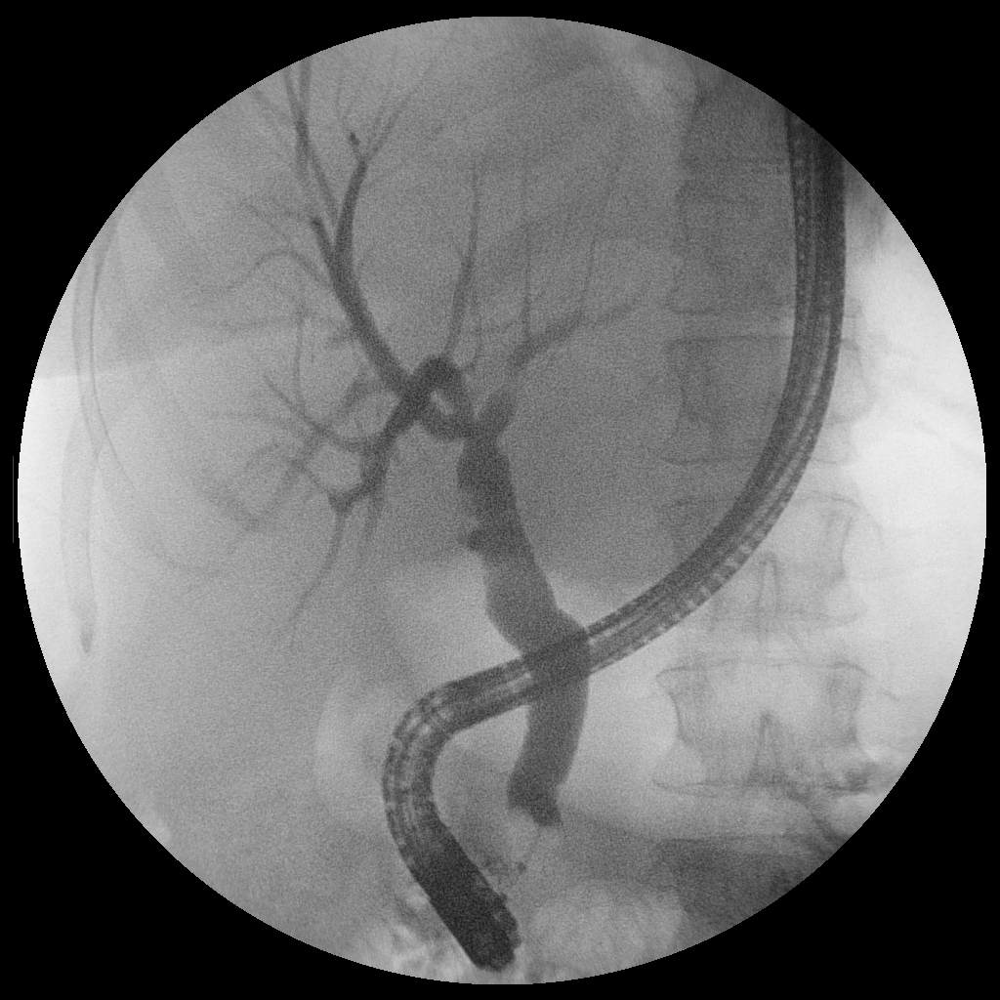

In [114]:
image = cv2.imread("original_images/0020410.bmp")
cv2_imshow(image)

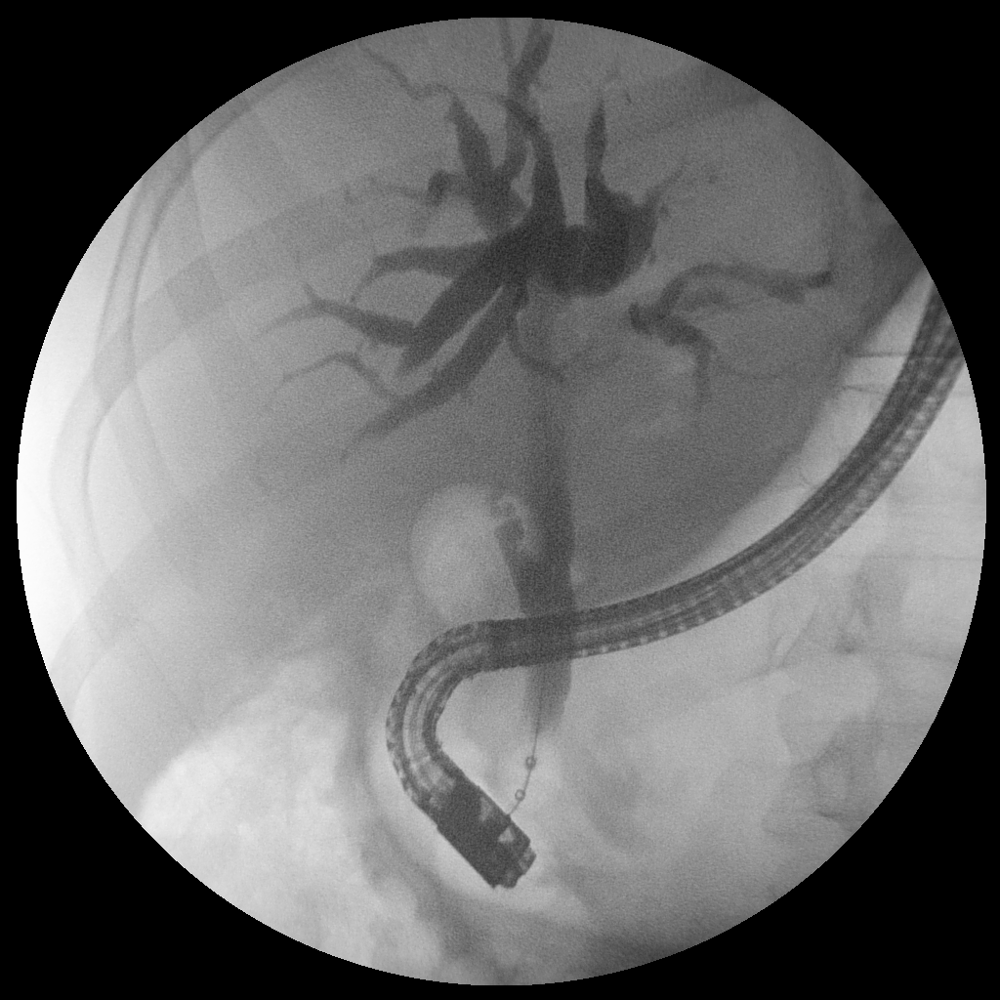

In [115]:
image2 = cv2.imread("original_images/0033408.bmp")
cv2_imshow(image2)

# Data augmentation


## Histogramme

In [116]:
def histo(img):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  plt.plot(hist)
  plt.show()

def histo_eq(img):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  cdf = hist.cumsum()
  cdf_normalized = cdf * float(hist.max()) / cdf.max()
  plt.plot(cdf_normalized, color = 'b')
  plt.hist(img.flatten(),256,[0,256], color = 'r')
  plt.xlim([0,256])
  plt.legend(('cdf','histogram'), loc = 'upper left')
  plt.show()

def img_modif_histo_eq(img):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  cdf = hist.cumsum()
  cdf_normalized = cdf * float(hist.max()) / cdf.max()
  cdf_m = np.ma.masked_equal(cdf,0)
  cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
  cdf = np.ma.filled(cdf_m,0).astype('uint8')
  img_eq = cdf[img]

  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(img),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(img_eq),plt.title('Equalized')
  plt.xticks([]), plt.yticks([])
  plt.show()
  return img_eq

def histo_stretch(img):
  mini = img.flatten().min()
  maxi = img.flatten().max()
  img2 = ((img-mini)/(maxi-mini))*255
  hist,bins = np.histogram(img2.flatten(),256,[0,256])
  plt.hist(img.flatten(),256,[0,256], color = 'r')
  plt.show()

def img_modif_histo_stretch(img):
  mini = img.flatten().min()
  maxi = img.flatten().max()
  img_stretch = ((img-mini)/(maxi-mini))*255
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(img),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(img_stretch),plt.title('Stretched')
  plt.xticks([]), plt.yticks([])
  plt.show()
  return img_stretch
  
def affiche_histo(img):
  img_stretch = img_modif_histo_stretch(img)
  img_eq = img_modif_histo_eq(img)
  images = [img,img_stretch,img_eq]
  labels = ['Original','Stretched','Equalized']
  fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
  for ax, img,lbl in zip(axes.ravel(), images,labels):
    ax.imshow(img)
    ax.set_title(lbl)
    ax.set_axis_off()
  plt.tight_layout()
  plt.show()

def afficher_histo(img):
  hist,bins = np.histogram(img.flatten(),256,[0,256])
  img_stretch = img_modif_histo_stretch(img)
  img_eq = img_modif_histo_eq(img)
  hist2,bins2 = np.histogram(img_stretch.flatten(),256,[0,256])
  hist3,bins3 = np.histogram(img_eq.flatten(),256,[0,256])

  plt.figure(1,figsize=(15,5))
  plt.subplot(1,3,1)
  plt.plot(hist)
  plt.title('Original')

  plt.subplot(1,3,2)
  plt.plot(hist2)
  plt.title('Stretched')

  plt.subplot(1,3,3)
  plt.plot(hist3)
  plt.title('Equalized')
  plt.show()


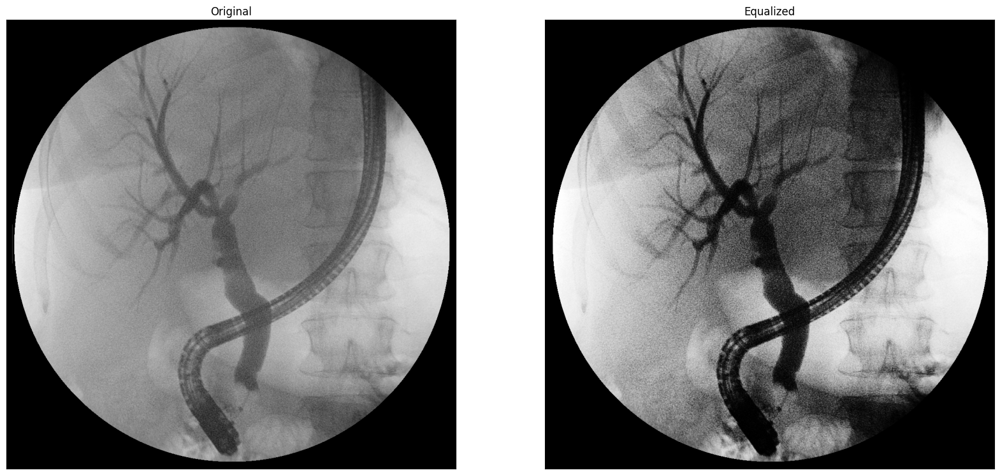

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [117]:
img_modif_histo_eq(image)

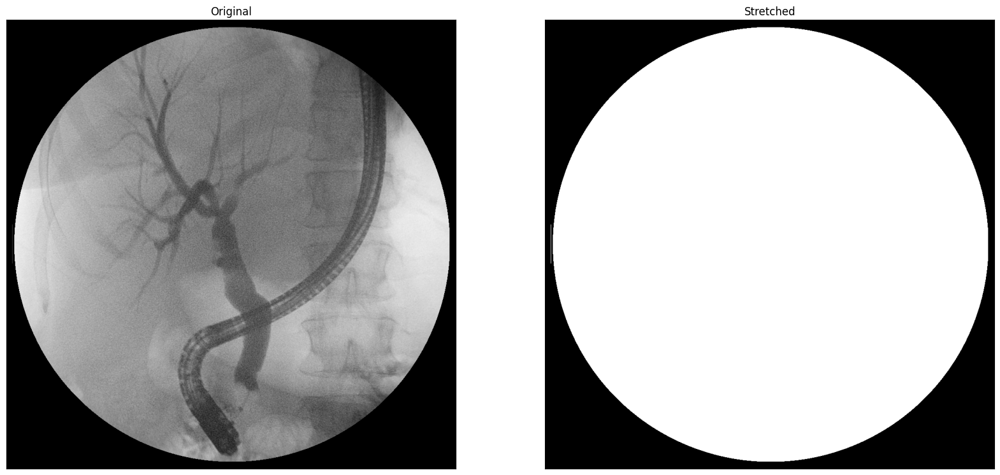

array([[[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       ...,

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]],

       [[0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.],
        ...,
        [0., 0., 0.],
        [0., 0., 0.],
        [0., 0., 0.]]])

In [118]:
img_modif_histo_stretch(image)

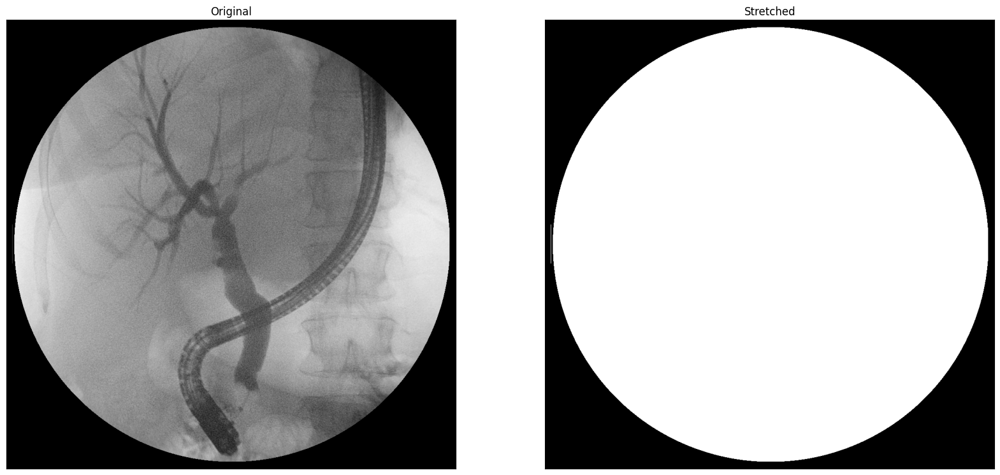

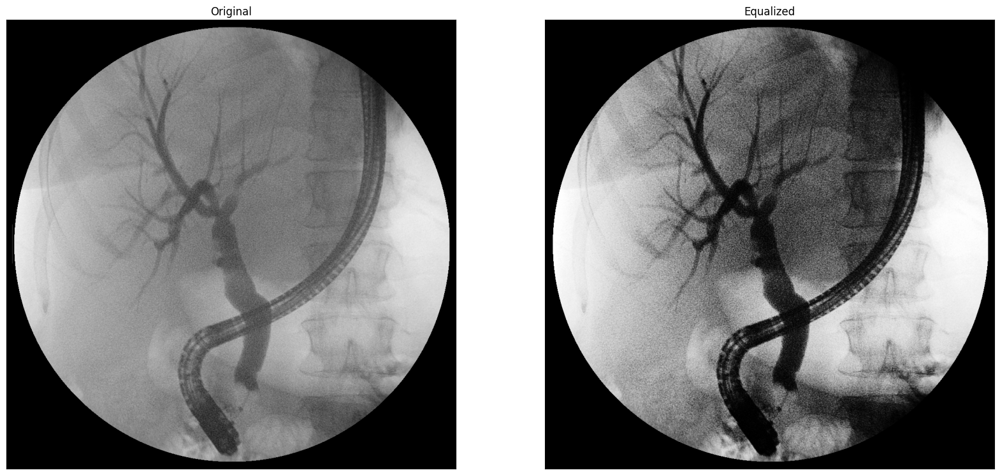

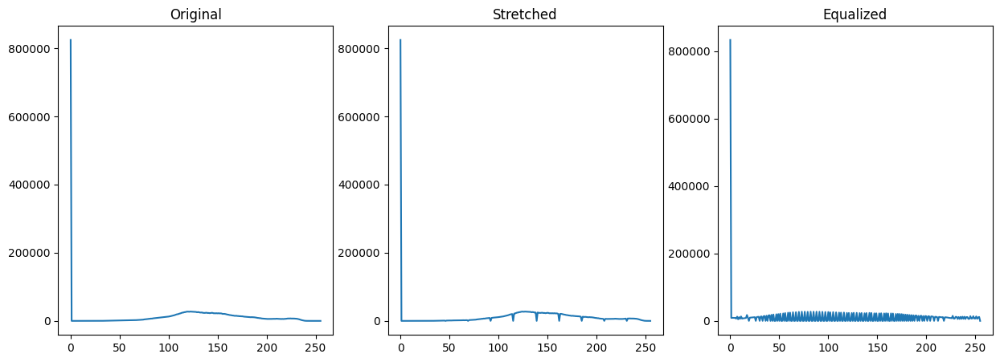

In [119]:
afficher_histo(image)

 ## Normalisation

In [120]:
def normalize(image):
  image_norm = cv2.normalize(image, None, alpha=0,beta=200, norm_type=cv2.NORM_MINMAX)
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(image_norm),plt.title('Normalized')
  plt.xticks([]), plt.yticks([])
  plt.show()

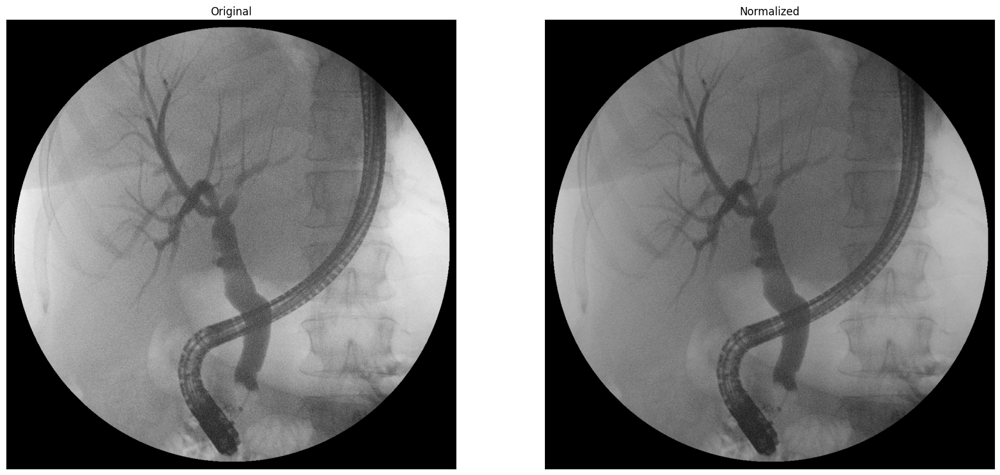

In [121]:
normalize(image)

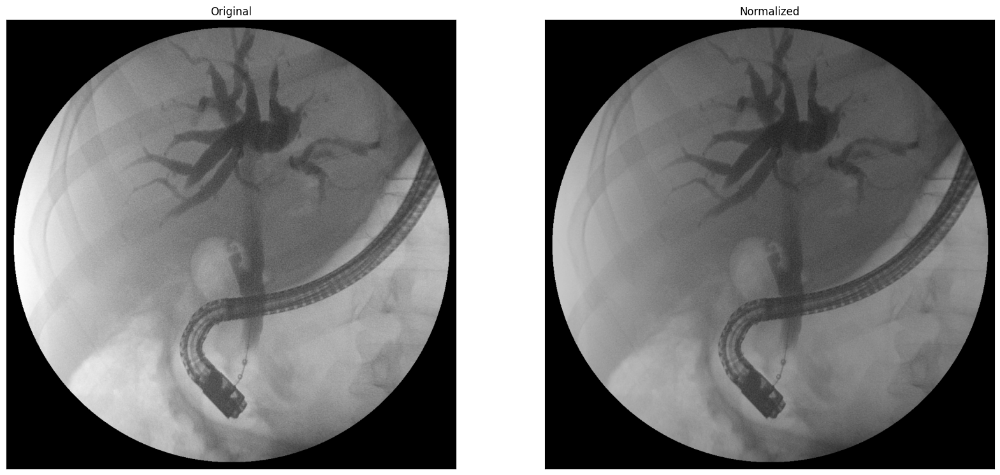

In [122]:
normalize(image2)

##Image smoothing 

In [123]:
def smoothing(image):
  blur = cv2.blur(image,(5,5))
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
  plt.xticks([]), plt.yticks([])
  plt.show()


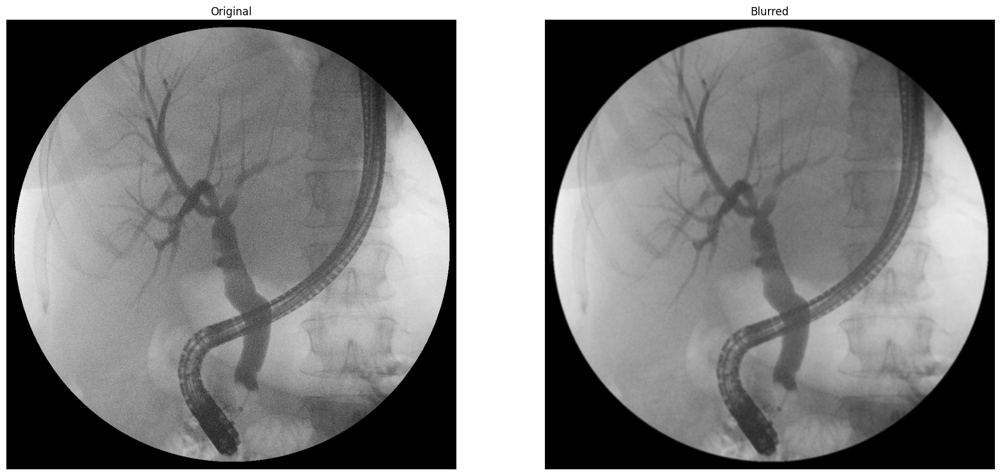

In [124]:
smoothing(image)

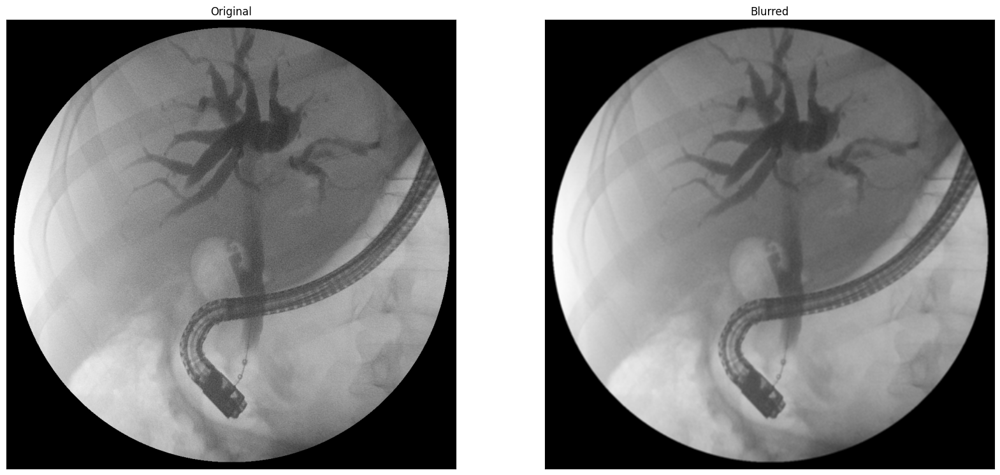

In [125]:
smoothing(image2)

In [126]:
def smoothing_gausian(image):
  blur = cv2.GaussianBlur(image,(5,5),0)
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(blur),plt.title('Blurred')
  plt.xticks([]), plt.yticks([])
  plt.show()

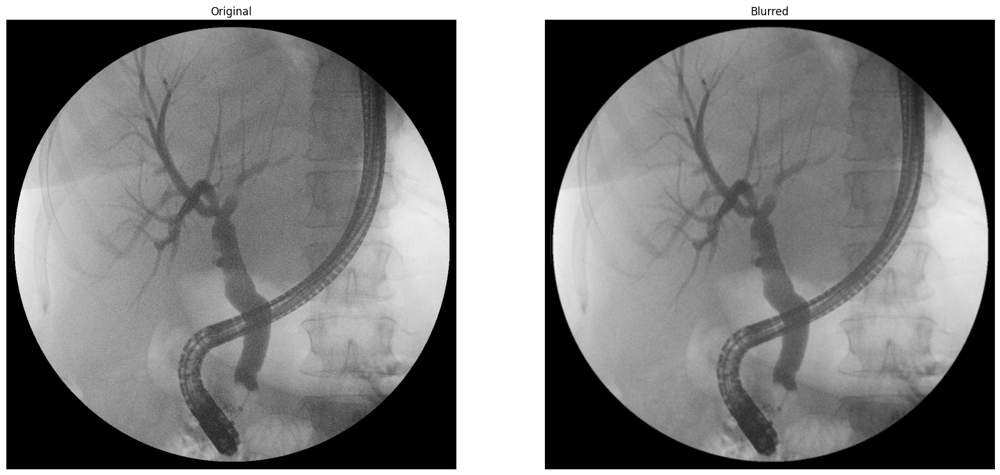

In [127]:
smoothing_gausian(image)

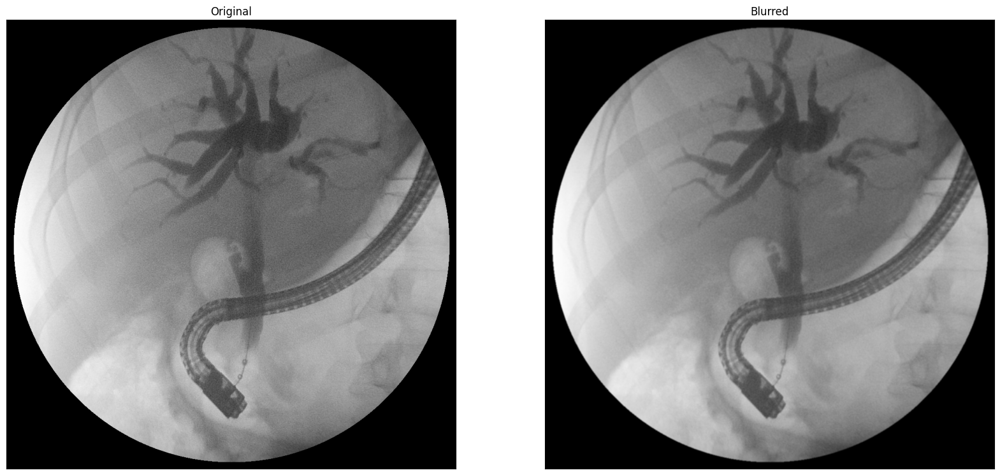

In [128]:
smoothing_gausian(image2)

## Data augmentation

###Rotation

In [129]:
def rotate(image, r1,r2):
  aug = iaa.Rotate((r1, r2))
  rotated_img = aug.augment_image(image)
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(rotated_img),plt.title('Rotated')
  plt.xticks([]), plt.yticks([])
  plt.show()

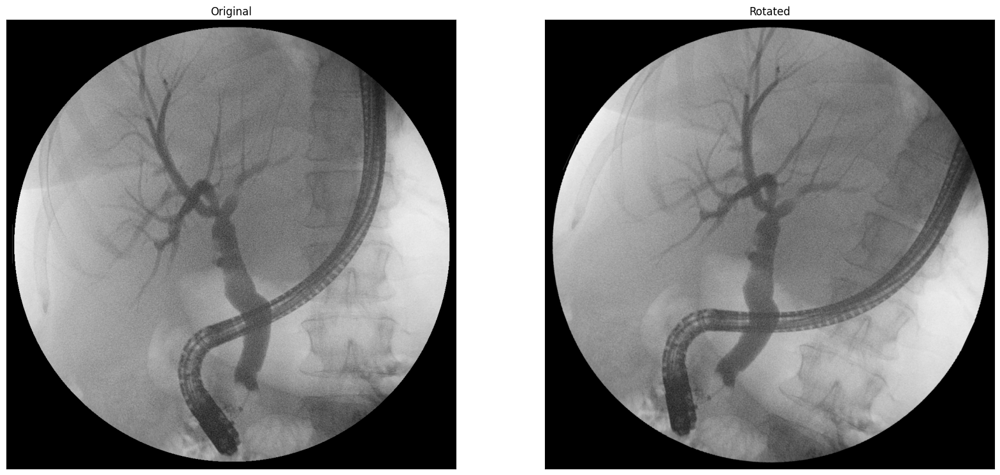

In [130]:
rotate(image, -45,45)

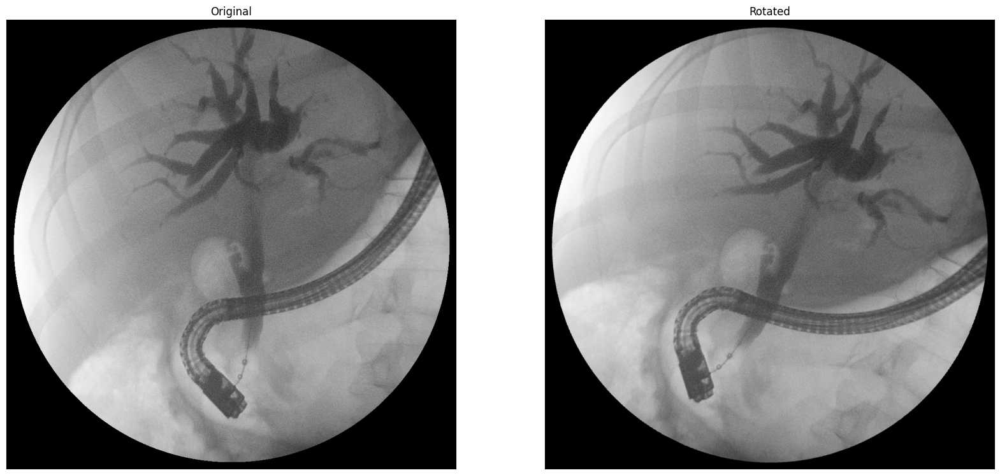

In [131]:
rotate(image2, -45,45)

### Bruit gaussien



```
aug = iaa.imgcorruptlike.GaussianNoise(severity=s)
img = aug.augment_image(image)
```



In [132]:
import imgaug.augmenters as iaa
def gaussian_noise(image, s):
  aug = iaa.imgcorruptlike.GaussianNoise(severity=s)
  img = aug.augment_image(image)
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(img),plt.title('Bruitée')
  plt.xticks([]), plt.yticks([])
  plt.show()

In [133]:
gaussian_noise(image,2)

Output hidden; open in https://colab.research.google.com to view.

In [134]:
gaussian_noise(image2,2)

Output hidden; open in https://colab.research.google.com to view.

### Flip


```

```



Il faudra vérifier que cela ne diminue pas les performances car biologiquement on ne verra pas d'images ainsi

In [135]:
import imgaug.augmenters as iaa
def flip(image, f):
  aug = iaa.Fliplr(f)
  img = aug.augment_image(image)
  fig = plt.figure(figsize=(20, 10))
  plt.subplot(121),plt.imshow(image),plt.title('Original')
  plt.xticks([]), plt.yticks([])
  plt.subplot(122),plt.imshow(img),plt.title('Flip')
  plt.xticks([]), plt.yticks([])
  plt.show()

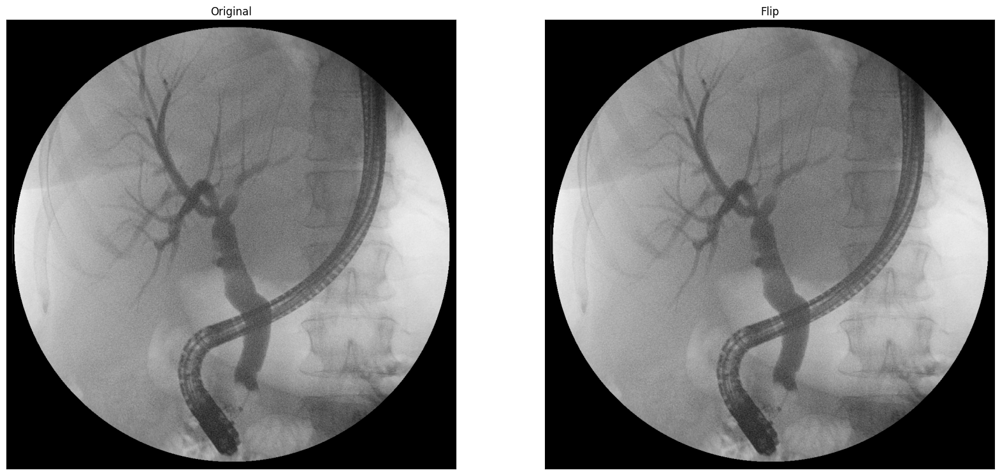

In [136]:
flip(image,0.5)

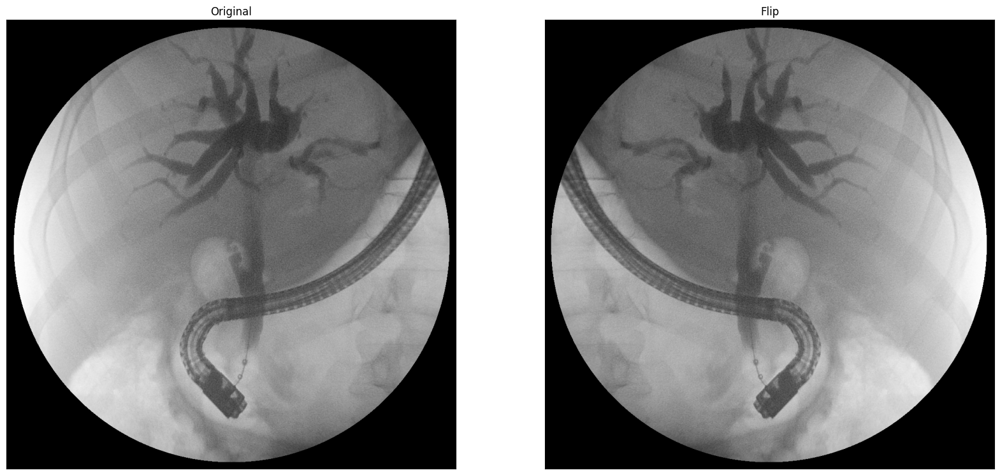

In [137]:
flip(image2,0.5)